In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

In [ ]:
def pre_process_image(img):
  # Convert the image to grayscale
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  # Apply Gaussian blur for noise reduction (kernel size of 7)
  denoised = cv2.GaussianBlur(gray, (7,7), 0)


  # Improve contrast with adaptive histogram equalization
  clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(32, 32))
  contrast_enhanced = clahe.apply(denoised)
  contrast_enhanced = cv2.GaussianBlur(contrast_enhanced, (5,5), 0)

  return gray, denoised, contrast_enhanced

def otsu_thresholding(img):
  # Apply Otsu's thresholding
  ret, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  return thresh
def evaluate_binarization(ground_truth, binarized_image):
    if len(ground_truth.shape) == 3:
        ground_truth = cv2.cvtColor(ground_truth, cv2.COLOR_BGR2GRAY)
    ground_truth=cv2.bitwise_not(ground_truth)
    binarized_image=cv2.bitwise_not(binarized_image)
    # Calculate True Positives, False Positives, False Negatives
    tp = np.sum(np.logical_and(ground_truth, binarized_image))
    fp = np.sum(np.logical_and(np.logical_not(ground_truth), binarized_image))
    fn = np.sum(np.logical_and(ground_truth, np.logical_not(binarized_image)))

    # Calculate F1 score
    precision = tp / (tp + fp + 1e-9)
    recall = tp / (tp + fn + 1e-9)
    f1_score = 2 * (precision * recall) / (precision + recall + 1e-9)

    # Calculate Intersection over Union (IoU)
    intersection = np.logical_and(ground_truth, binarized_image)
    union = np.logical_or(ground_truth, binarized_image)
    iou = np.sum(intersection) / np.sum(union)

    # Print evaluation metrics
    print("Intersection over Union (IoU):", iou)
    print("F1 Score:", f1_score)

    return

def post_processing(binarized_img):

    # Erosion followed by dilation
    kernel = np.ones((2,2),np.uint8)
    #erosion = cv2.erode(binarized_img, kernel, iterations=1)
    erosion = cv2.dilate(binarized_img, kernel, iterations=2)
    dilation = cv2.erode(erosion, kernel, iterations=1)
    # Median blur
    median_blur = cv2.medianBlur(dilation, 5)

    return erosion, dilation, median_blur

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


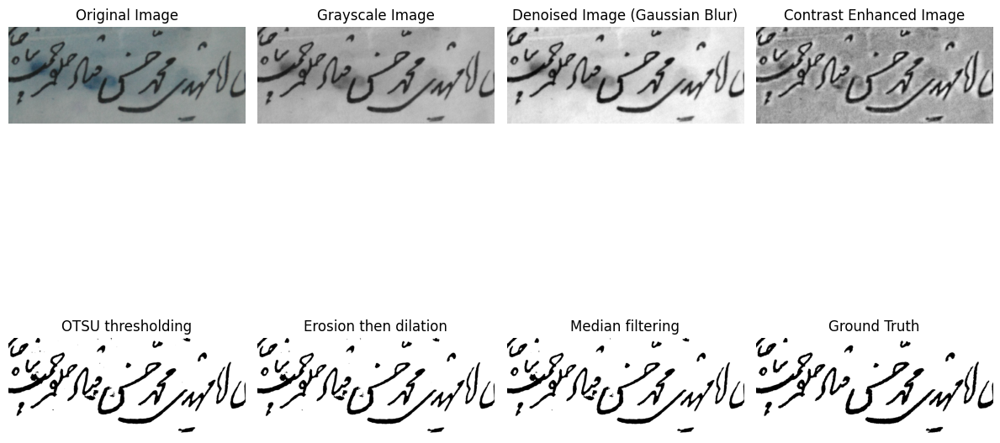

Intersection over Union (IoU): 0.8503299801089834
F1 Score: 0.9191117138969414
Binarization complete for Persian01.jpg


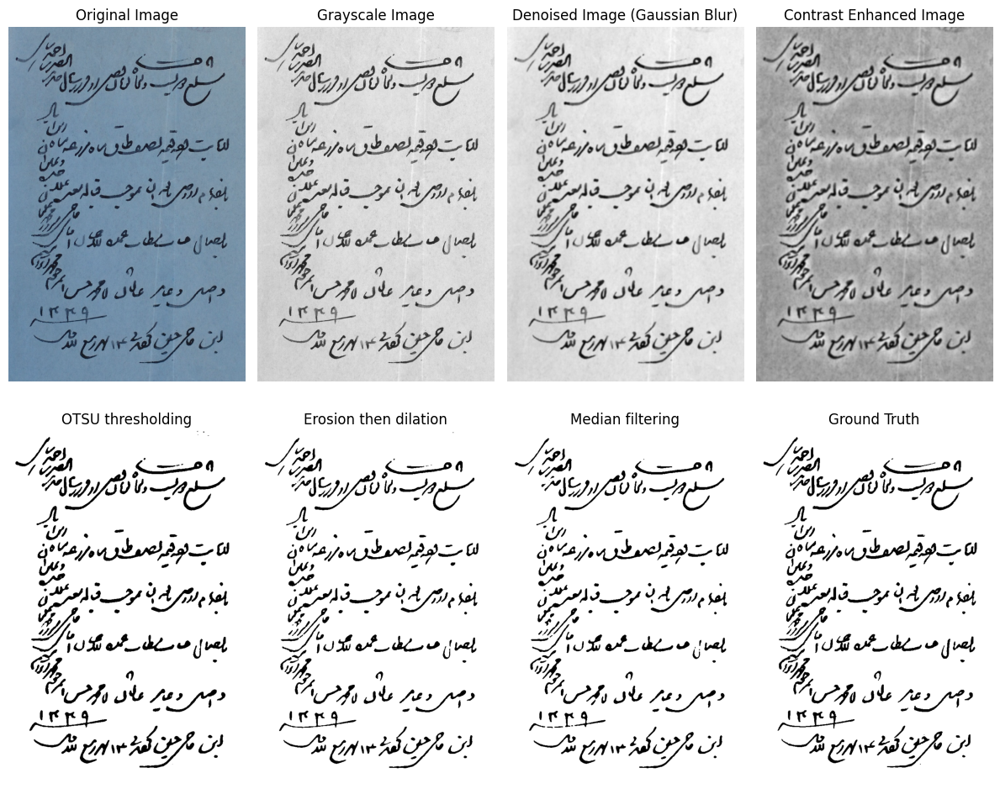

Intersection over Union (IoU): 0.8439279869067103
F1 Score: 0.9153589429080944
Binarization complete for Persian05.jpg


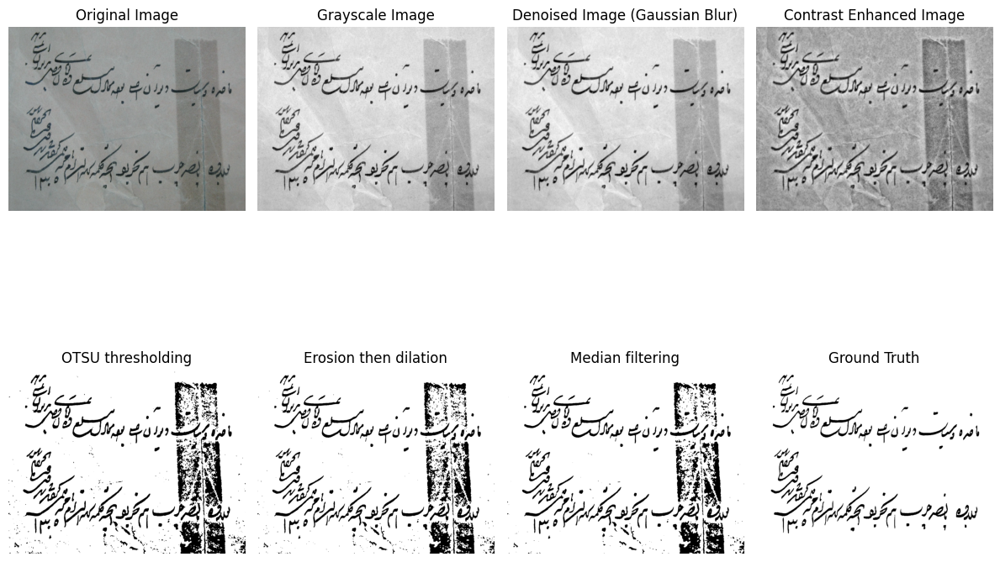

Intersection over Union (IoU): 0.3793831896438082
F1 Score: 0.5500765736679285
Binarization complete for Persian06.jpg


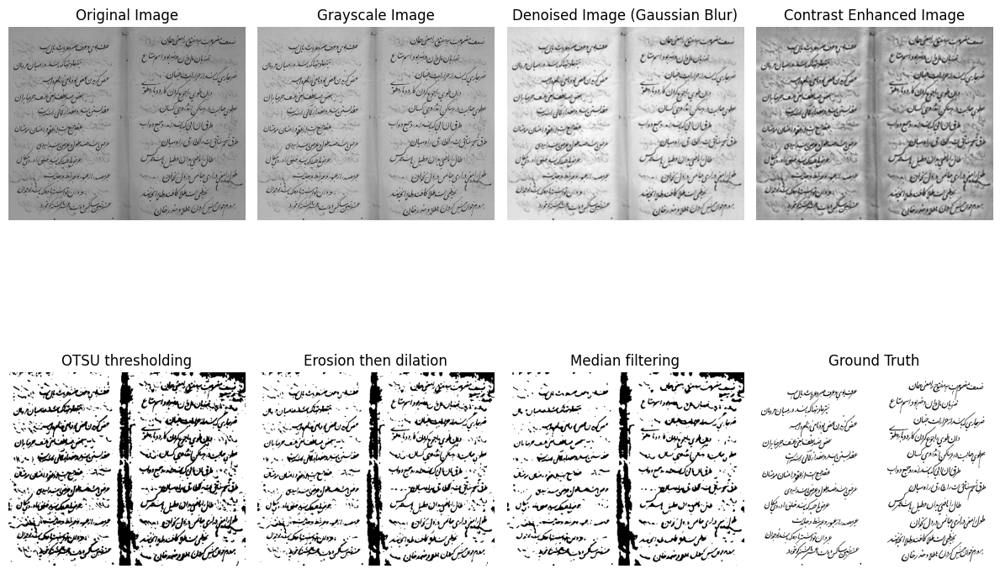

Intersection over Union (IoU): 0.31689958287182146
F1 Score: 0.4812813167332739
Binarization complete for Persian07.jpg


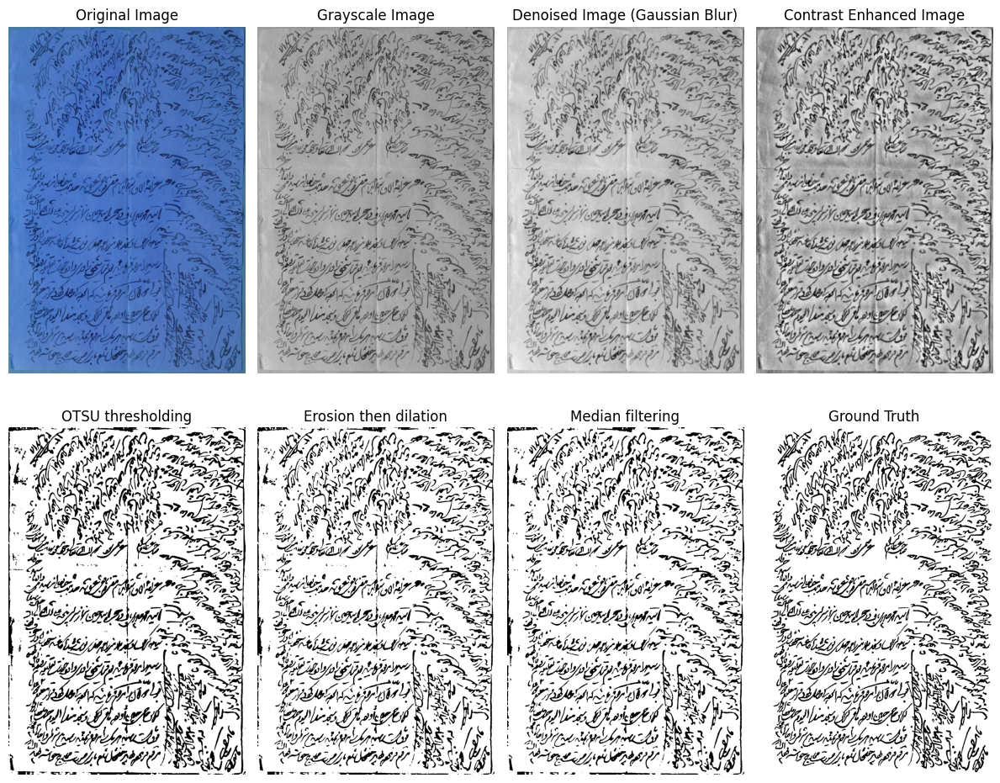

Intersection over Union (IoU): 0.7534495799919826
F1 Score: 0.859391211649137
Binarization complete for Persian09.jpg


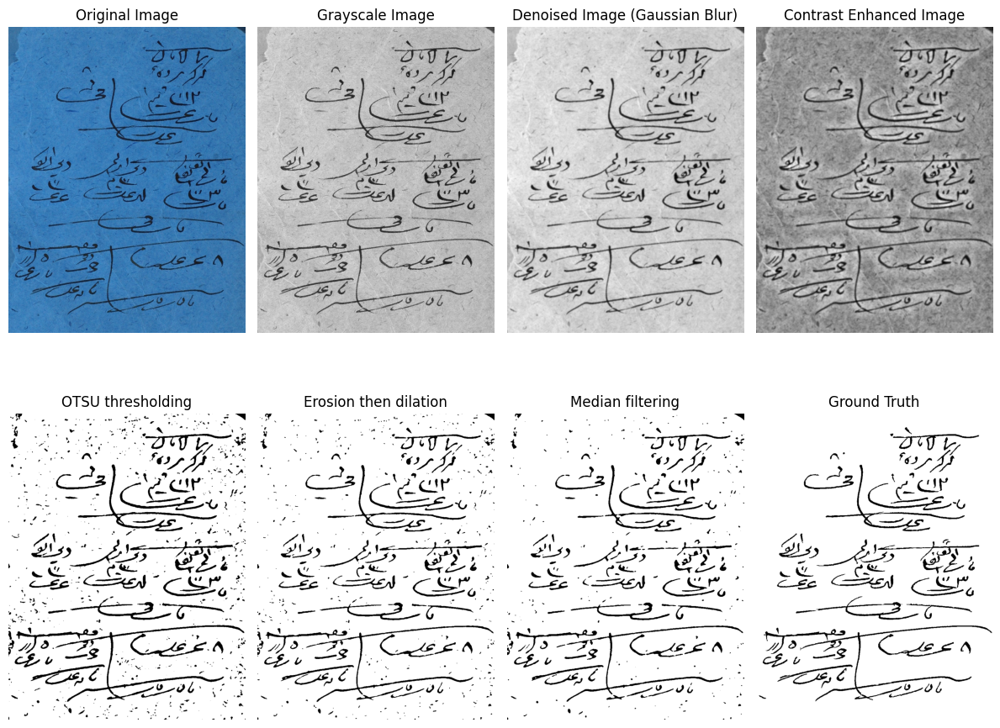

Intersection over Union (IoU): 0.666439529107977
F1 Score: 0.7998364381839341
Binarization complete for Persian10.jpg


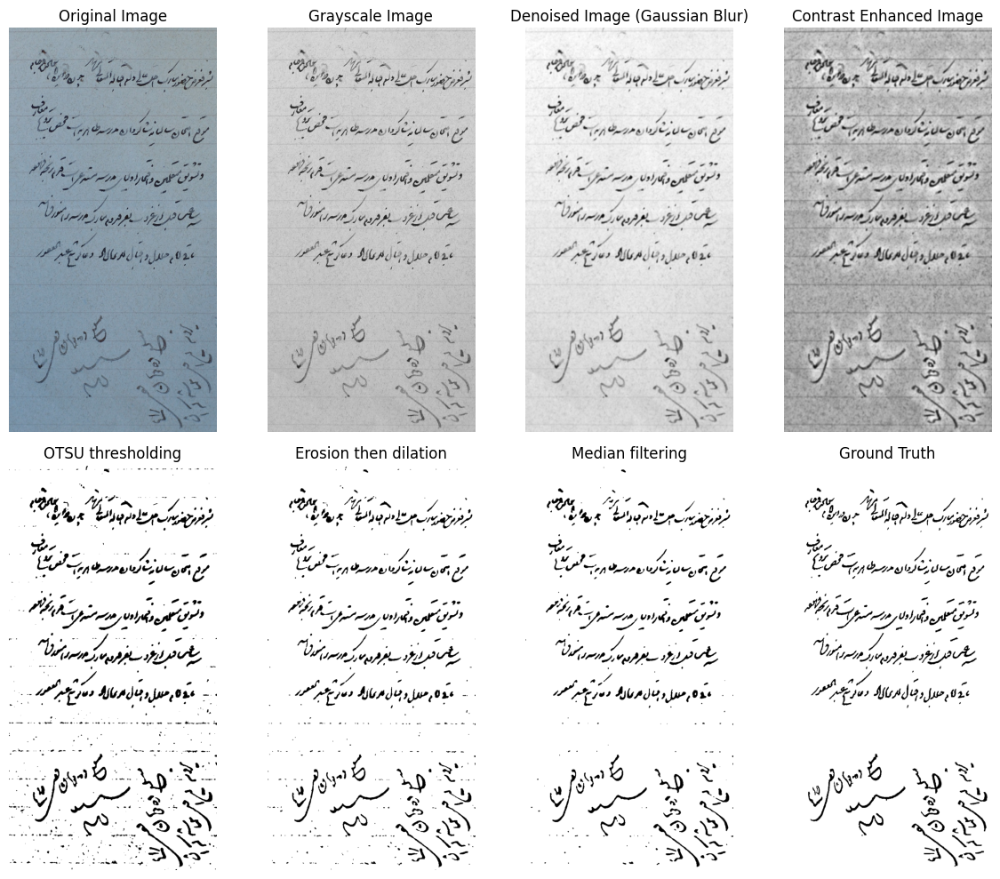

Intersection over Union (IoU): 0.672059989179804
F1 Score: 0.8038706662697542
Binarization complete for Persian11.jpg


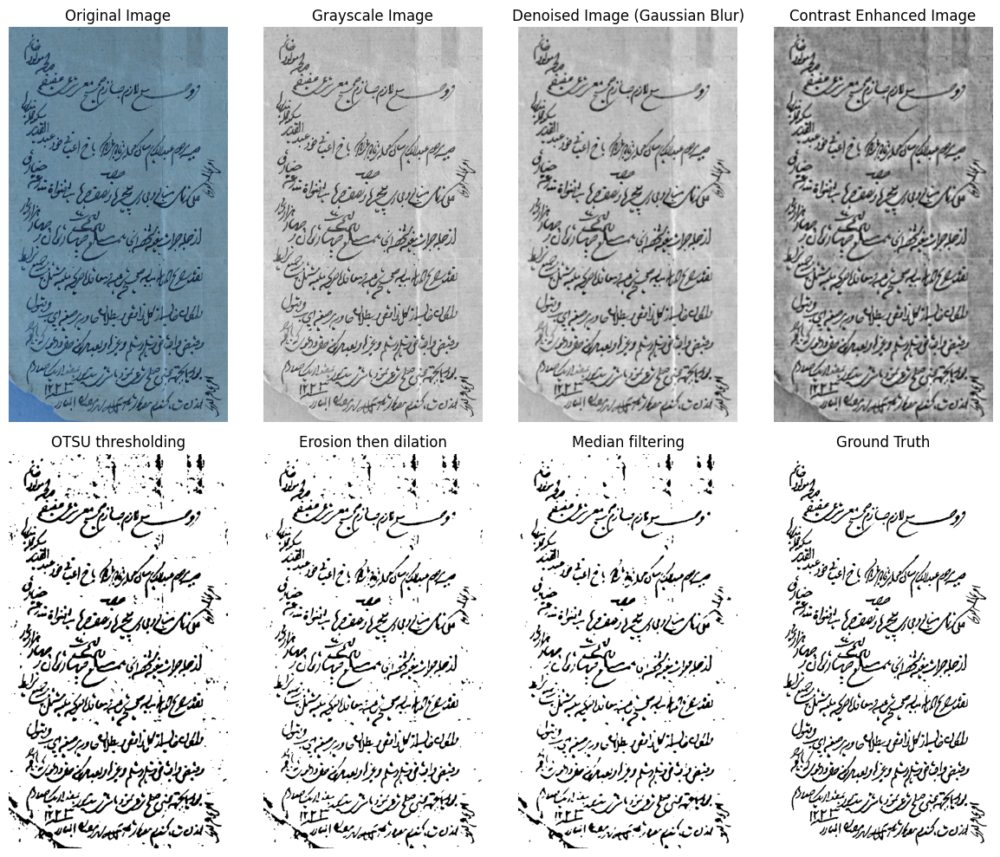

Intersection over Union (IoU): 0.6899485017930894
F1 Score: 0.8165319838426661
Binarization complete for Persian12.jpg


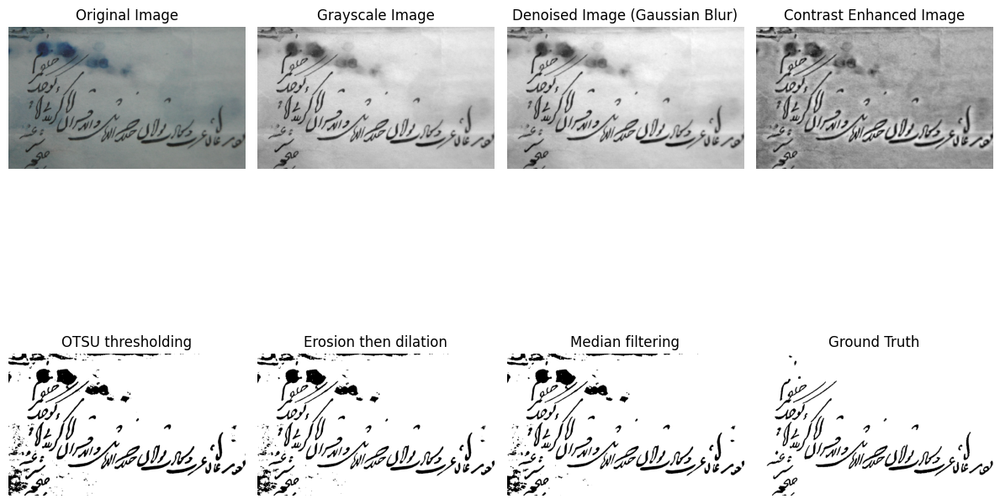

Intersection over Union (IoU): 0.5222830111773857
F1 Score: 0.6861838527989484
Binarization complete for Persian13.jpg


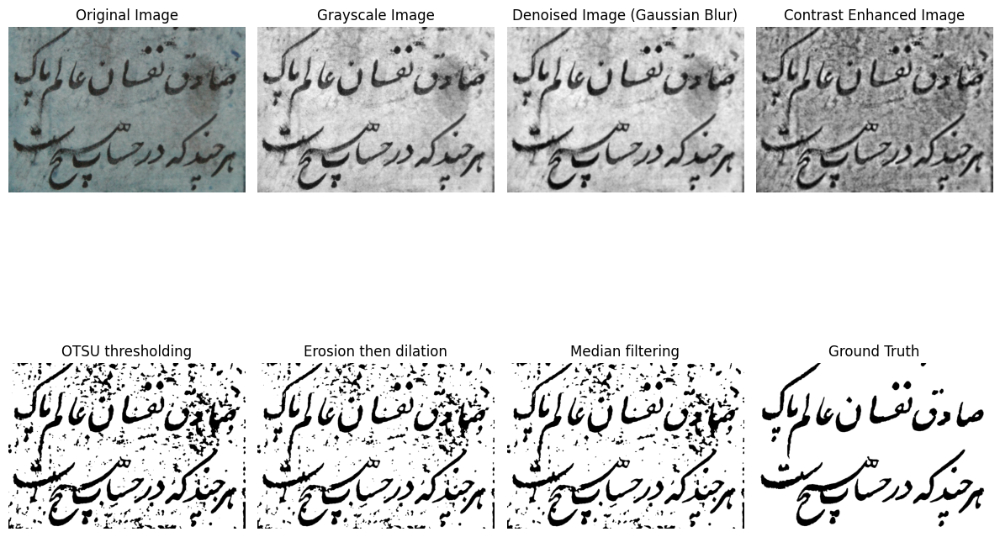

Intersection over Union (IoU): 0.5495600828233081
F1 Score: 0.7093110987450848
Binarization complete for Persian14.jpg


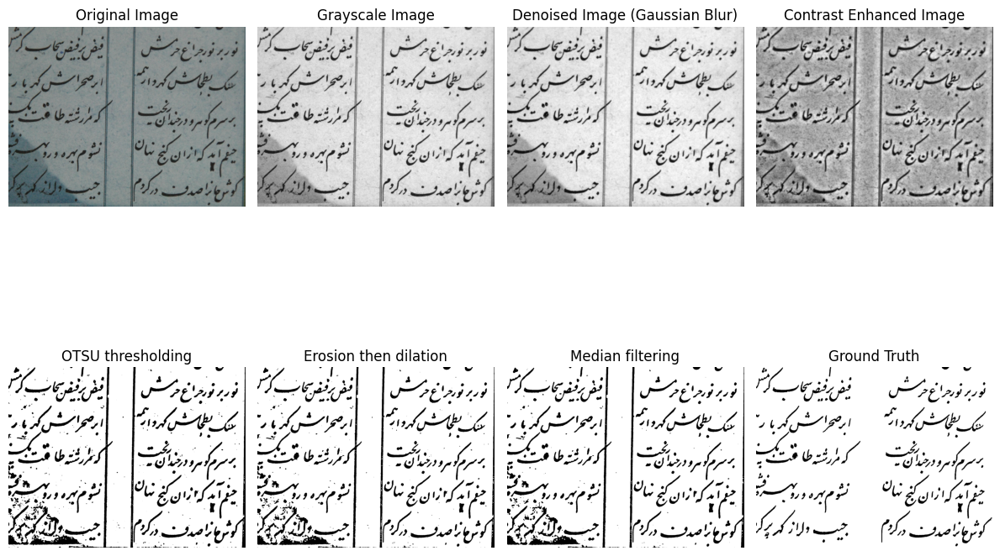

Intersection over Union (IoU): 0.5400001318721894
F1 Score: 0.701298812051687
Binarization complete for Persian15.jpg


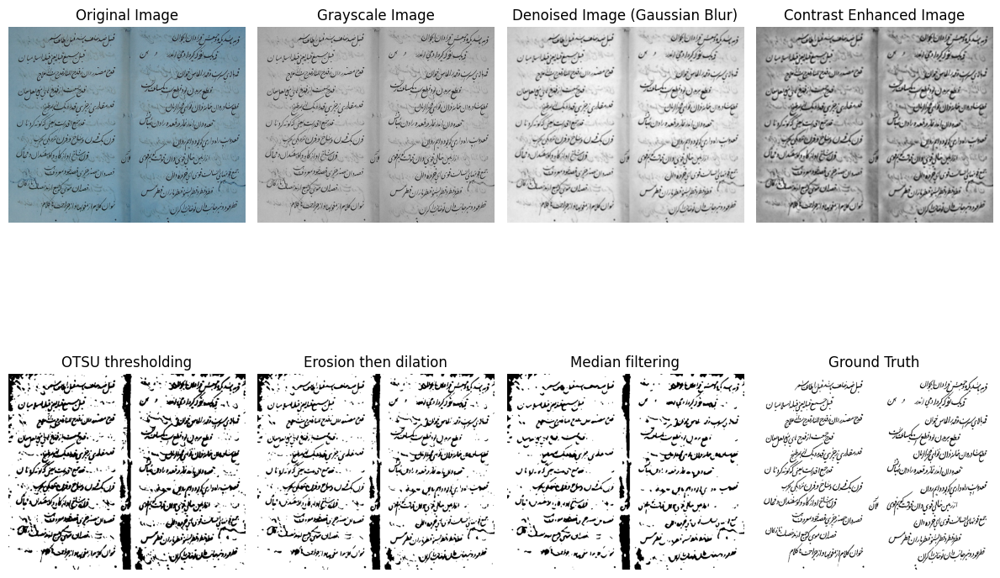

Intersection over Union (IoU): 0.37258662099011375
F1 Score: 0.5428970602109955
Binarization complete for Persian02.jpg


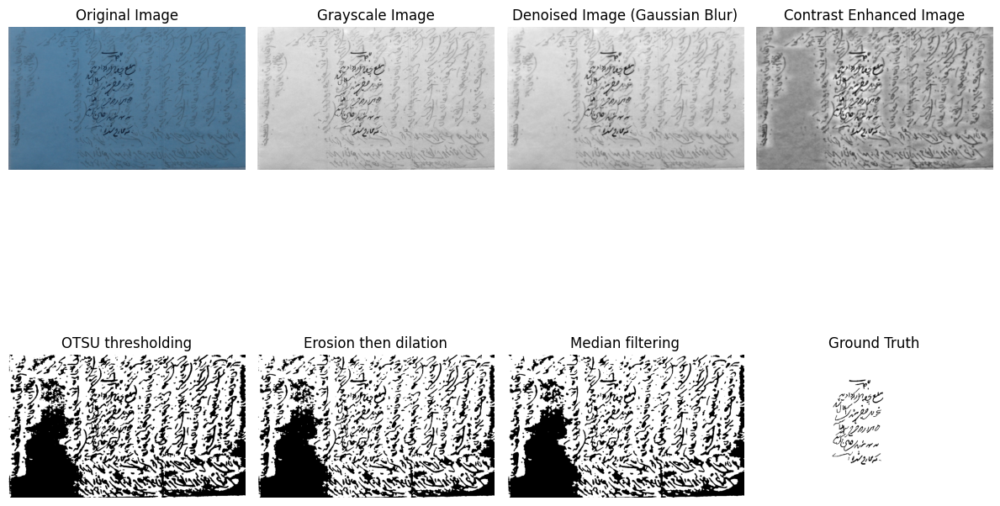

Intersection over Union (IoU): 0.038562958640469915
F1 Score: 0.07426214902433179
Binarization complete for Persian08.jpg


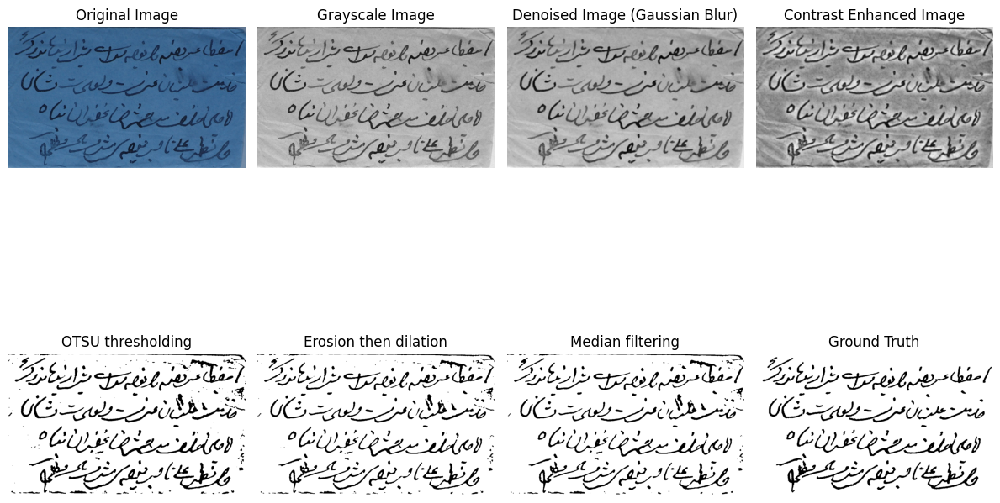

Intersection over Union (IoU): 0.7562084357454644
F1 Score: 0.8611830121289644
Binarization complete for Persian04.jpg


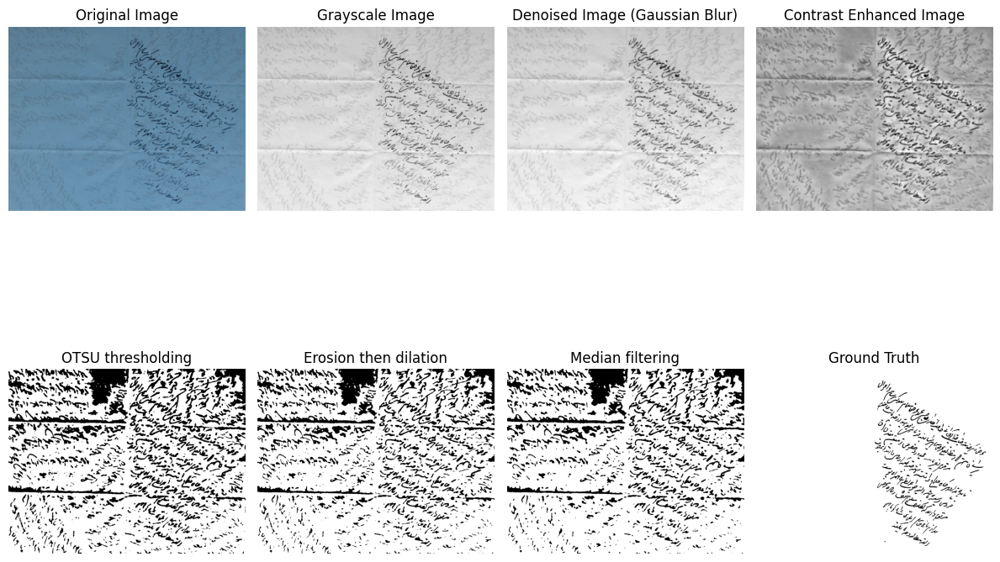

Intersection over Union (IoU): 0.1439798782750954
F1 Score: 0.25171750112514124
Binarization complete for Persian03.jpg


In [ ]:
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')

# Path to folder containing images
image_folder = "/content/drive/MyDrive/Colab Notebooks/CV_assignment_1/Original"

# Path to folder containing ground truth images
ground_truth_folder = "/content/drive/MyDrive/Colab Notebooks/CV_assignment_1/GT"

# Iterate over each image in the folder
for filename in os.listdir(image_folder):
    if filename.endswith(".jpg") or filename.endswith(".png"):  # Ensure only image files are processed
        # Load the image
        img_path = os.path.join(image_folder, filename)
        img = cv2.imread(img_path)

        # Preprocess the image
        gray, denoised, contrast_enhanced = pre_process_image(img.copy())

        '''# Display grayscale conversion result
        cv2_imshow(img)
        cv2_imshow(gray)

        # Display noise reduction result
        cv2_imshow(denoised)

        # Display contrast enhancement result
        cv2_imshow(contrast_enhanced)

        # Perform binarization with Otsu's method
        binarized_img = otsu_thresholding(contrast_enhanced)
        erosion, dilation, processed_image = post_processing(binarized_img)

        # Display post processing result
        cv2_imshow(processed_image)'''
        # Display grayscale conversion result
        plt.figure(figsize=(12, 10))
        plt.subplot(2, 4, 1)
        plt.imshow(img)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, 4, 2)
        plt.imshow(gray, cmap='gray')
        plt.title("Grayscale Image")
        plt.axis('off')

        # Display noise reduction result
        plt.subplot(2, 4, 3)
        plt.imshow(denoised, cmap='gray')
        plt.title("Denoised Image (Gaussian Blur)")
        plt.axis('off')

        # Display contrast enhancement result
        plt.subplot(2, 4, 4)
        plt.imshow(contrast_enhanced, cmap='gray')
        plt.title("Contrast Enhanced Image")
        plt.axis('off')

        # Perform binarization with Otsu's method
        binarized_img = otsu_thresholding(contrast_enhanced)
        erosion, dilation, processed_image = post_processing(binarized_img)

        # Display post processing result
        plt.subplot(2, 4, 5)
        plt.imshow(binarized_img, cmap='gray')
        plt.title("OTSU thresholding")
        plt.axis('off')

        plt.subplot(2, 4, 6)
        plt.imshow(dilation, cmap='gray')
        plt.title("Erosion then dilation")
        plt.axis('off')

        plt.subplot(2, 4, 7)
        plt.imshow(processed_image, cmap='gray')
        plt.title("Median filtering")
        plt.axis('off')

        # Load ground truth image for evaluation
        ground_truth_path = os.path.join(ground_truth_folder, filename[:-3]+"png")
        if os.path.exists(ground_truth_path):
            ground_truth = cv2.imread(ground_truth_path)
            #cv2_imshow(ground_truth)
            plt.subplot(2, 4, 8)
            plt.imshow(ground_truth, cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')
            plt.tight_layout()
            plt.show()
            evaluate_binarization(ground_truth, binarized_img)
        else:
            print("Ground truth not found for", filename)

        print("Binarization complete for", filename)